In [62]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
import string
import plotly.express as px
import gensim
import pyLDAvis
import pyLDAvis.gensim_models
import matplotlib.pyplot as plt
import gensim.corpora as corpora
import pandas as pd
import numpy as np
import warnings
import re
import matplotlib.pyplot as plt
import demoji

from wordcloud import WordCloud
from nltk.corpus import stopwords
from collections import Counter
from pathlib import Path
from datetime import datetime
from babel.dates import format_datetime
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory, StopWordRemover, ArrayDictionary
from gensim.models import CoherenceModel

In [ ]:
warnings.filterwarnings("ignore")

In [63]:
#path lokasi folder dataset

path = 'C:/Users/WINDOWS 10/Documents/Skripsi/scrapingFIX' #/FIXCSV
li = []

for file in Path(path + '/FIXCSV').glob('*.csv'):
    li.append(pd.read_csv(file))

df = pd.concat(li, axis=0, ignore_index=True)

In [64]:
#upload the neccesary file

extra_stopword = pd.read_csv('extra_stopword.csv')
token_trmv = pd.read_csv('bigram_toremove.csv')

In [65]:
df_train = df.copy()

In [66]:
df_train['tahun'] = df_train['date'].str.split().str[-1]

In [67]:
#add newstopword
stopword = stopwords.words('indonesian')
more_stopword = extra_stopword['stopword'].values.tolist()
new_stopword = ['apakan', 'permisi', 'indikasi', 'infonya', 'kambuh','disertai', 'menerus',  
                'petunjuk', 'indonesia', 'sebabkan', 'penjelasannya', 'mhon', 'resiko', 'x', 'syaa','sisa',
                'obatnya', 'sakitnya', 'seminggu', 'diatas', 'sblumnya', 'memelihara', 'team', 
                'apotek', 'seeing', 'benang', 'tempatnya', 'nyembuhinnya', 'bahaya', 'dook', 
                'mencegah', 'berenang', 'bangun', 'rasakan', 'berjalan', 'alodok', 'bahayakah', 
                'beserta', 'buang', 'dibagian', 'mengobati', 'meminum', 'dianjurkan', 'dipakai', 
                'bahan', 'sebabkan', 'perbaikan', 'lanjutan', 'keponakan', 'semenjak', 'menanganinya', 
                'ditemui', 'assalamualaikumsaya', 'dduk', 'mencampurkan', 'soalya', 'asalamualikum', 
                'nyembuhinya', 'tempatnya', 'dduk', 'minuman', 'makanan', 'menyamakan', 'bagaiamana', 
                'bahayanya', 'bersepeda', 'berenang', 'mengisi', 'menghisap', 'menurunkan', 'tetangga','celana',
                'menyebabkan', 'disebabkan', 'akibat', 'klinik','total', 'pasien', 'membesar', 'test',
                'kg', 'rs', 'latihan', 'ber', 'ikan', 'minyak', 'keluhan', 'sehari', 'bawa', 'bagus', 'berbeda', 'sekolah', 
                'berbicara' , 'ayah','ibu', 'kakek', 'kakak','adik', 'saudara', 'kak', 'kakak', 'kakaknya', 'adiknya', 'kakaknya',
                'kebiasaan','berhenti','adek','mencium','kelas','suami','istri','laki','perempuan','perempuannya','lakinya','lakilaki',
                'kemudian', 'kmudian','kedepannya', 'kasihhh', 'mempunyain', 'kuatt', 'blakangn', 'menggerakkan', 'diwajah', 'ulasan', 'mrasa',
                'kendala', 'mengeluarkn', 'mendingan', 'memangnya', 'tahapan', 'sruh','belilah', 'semlm', 'ornh', 'rasany', 'berumur', 'ketimbang',
                'berhubungan', 'beresiko', 'ajukan', 'teraba','hruskh', 'thnks', 'tandanya', 'tambalannya', 'belakanh', 
                'disebab', 'direct','mengetahuinya', 'mkasih', 'solusix', 'trsebut', 'rutin', 'kesehatan', 'kucing', 'melulu','mengendarai',
                'motor','menderita', 'penanganan', 'dokternya', 'bantuan', 'dirawat', 'penyembuhan', 'mempengaruhi', 'mengakibatkan', 'ambil', 'rawat',
                'dibawah', 'sekian', 'sengaja', 'bermasalah', 'perihal', 'senin', 'selasa', 'rabu', 'kamis', 'sabtu', 'membaik', ]
more_stopword.extend(new_stopword)
stopword.extend(more_stopword)
not_stopword = {'capek','dpt','menikah','sakit'}
#fix stopword
fin_stp = set([word for word in stopword if word not in not_stopword])

In [68]:
# sastrawi stopword
stop_word2 = StopWordRemoverFactory()
data_stp2 = stop_word2.get_stop_words() + more_stopword

In [69]:
final_stopword2 = StopWordRemover(ArrayDictionary(data_stp2))

In [70]:
#stemmer

stemmer = StemmerFactory().create_stemmer()

In [71]:
#slang word
baku = pd.read_csv(path + '/baku/baku[ori].csv')

std_word_replace = {}
for i, row in enumerate(baku['slang']):
    std_word_replace[row] = baku['baku'].iloc[i]

In [72]:
df_train = df_train.dropna().reset_index(drop=True)

In [73]:
df_train.head()

,title,question,user_name,user_type,date,link,tahun
0,Bengkak dan merah pasca imunisasi DPT,"Dok,anak saya sudah imunisasi DPT, terus bekas...",An**i,Anggota,14 Januari 2018,https://www.alodokter.com/komunitas/topic/beng...,2018
1,penyebab mendengar suara yang terdengar lebih ...,"Dok, suara yang saya dengar tiba"" menjadi sang...",ha*****8,Anggota,16 Januari 2018,https://www.alodokter.com/komunitas/topic/suar...,2018
2,Perbedaan gejala hamil dengan sakit maag,mlm donk saya rina udah menikah usia 24 tahun ...,Va******o,Anggota,16 Januari 2018,https://www.alodokter.com/komunitas/topic/apak...,2018
3,Mengatasi kepala pusing dan susah tidur,Dok saya mau bertanya kenapa ya saya akhir2 in...,Li***h,Anggota,16 Januari 2018,https://www.alodokter.com/komunitas/topic/kepa...,2018
4,penggunaan biotin untuk menumbuhkan rambut,"selamat malam dokter, saya mau tau info dong, ...",He*i,Anggota,16 Januari 2018,https://www.alodokter.com/komunitas/topic/biot...,2018


In [74]:
#training section
df_training = df_train[['title', 'question','date','tahun']]

In [75]:
df_pie = df_training.copy()
df_pie = df_pie[df_pie['tahun'] >= '2018']
fig_pie = px.pie(df_pie, values='tahun', names='tahun', title='Jumlah Data Tahun 2018-2020')
fig_pie.update_traces(textposition='inside', textinfo='percent+label')
fig_pie.show()

In [77]:
#cleaning method

def remove_punct(text):
    if isinstance(text, float):
        return text
    text = text.lower()

    # Remove punctuation and digits
    text = text.replace(',', ' ')
    text = re.sub(r'[{}{}]'.format(string.punctuation, string.digits + '\n'), ' ', text)
    text = ''.join('' if a in string.punctuation + string.digits else a for a in text)

    # remove emoji 
    text = demoji.replace(text, '')
    text = text.replace('\n', ' ')
    text = text.replace('\r', ' ')
    text = text.replace('\t', ' ')
    text = text.replace('\xa0', ' ')
    text = text.replace('\u200b', ' ')
    text = text.replace('\u200c', ' ')
    text = text.replace('\u200d', ' ')
    text = text.replace('\ufeff', ' ')
    text = text.replace('\u200e', ' ')
    text = text.replace('\u200f', ' ')
    text = text.replace('\u2061', ' ')
    text = text.replace('\u2062', ' ')
    text = text.replace('\u2063', ' ')
    return text

def dok_word(text):
    text = remove_punct(text)
    split_dok = text.split()
    for i, word in enumerate(split_dok):
        if word.startswith('dok') and len(word) > 3:
            split_dok[i] = 'dok' + word.replace('dok', '', 1)
    text = " ".join(split_dok)
    return text

def normalization(text):
    text = dok_word(text)
    temp_list = []
    temp_normalization = text.split()
    for i in temp_normalization:
        if i not in std_word_replace:
            temp_list.append(i)
        elif i in std_word_replace:
            temp_list += std_word_replace[i].split()
    temp_list = ' '.join(text for text in temp_list if text not in fin_stp)
    return temp_list

def token_funct(text):
    text = list(normalization(text).split(" "))
    return text

In [78]:
df_training['clean2'] = df_training['question'].apply(lambda x: token_funct(x))

In [79]:
def make_bigrams(texts):
    bigram = gensim.models.Phrases(texts, min_count=3, threshold=1)
    bigram_mod = gensim.models.phrases.Phraser(bigram)

    unique_bigrams = set()
    filtered_texts = []

    for doc in texts:
        bigram_doc = bigram_mod[doc]
        filtered_bigram_doc = []

        for token in bigram_doc:
            if '_' in token:
                word1, word2 = token.split('_')
                if (word2 + '_' + word1) not in unique_bigrams:
                    unique_bigrams.add(token)
                    filtered_bigram_doc.append(token)
            else:
                filtered_bigram_doc.append(token)

        filtered_texts.append(filtered_bigram_doc)

    return filtered_texts

def trigram_func(texts):
    bigram = make_bigrams(texts)
    trigram = gensim.models.Phrases(bigram, min_count=1)
    trigram_mod = gensim.models.phrases.Phraser(trigram)
    return [trigram_mod[doc] for doc in texts]


bigrams18 = make_bigrams(df_training['clean2'])
trigrams18 = trigram_func(df_training['clean2'])

In [ ]:
bigrams = [bigram for doc in bigrams18 for bigram in doc if '_' in bigram]
trigrams = [trigram for doc in trigrams18 for trigram in doc if '_' in trigram]

def visualize_frequent_words(tokens_list, num_words):
    # Count the frequency of each token
    word_freq = Counter(tokens_list)
    
    # Get the most frequent words
    top_words = word_freq.most_common(num_words)
    
    # Extract the words and their counts
    words = [w[0] for w in top_words]
    counts = [w[1] for w in top_words]
    
    # Create a bar chart of the word frequencies
    figure = px.bar(x=words, y=counts, title='Top {} Most Frequent Words'.format(num_words), height=500, width=900)
    figure.update_layout(xaxis_title='Word', yaxis_title='Frequency', plot_bgcolor="white")
    figure.update_xaxes(tickangle=45)
    figure.update_yaxes(tickformat=',d')
    figure.show()

In [ ]:
visualize_frequent_words(bigrams, 20)

In [ ]:
visualize_frequent_words(trigrams, 20)

In [80]:
def remove_tokens(docs, tokens_to_remove):
    filtered_docs = []
    for doc in docs:
        filtered_doc = [token for token in doc if token not in tokens_to_remove]
        filtered_docs.append(filtered_doc)
    return filtered_docs

In [81]:
token_toremove = token_trmv['ttr'].values.tolist()
new_token_toremove = ['minum_kakak','anak_berumur','anak_usianya', 'anak_susah', 'kanan_kiri',
                      'marah_marah', 'gigi_gigi', 'mata_mata', 'anak_anak','haid_haid','obat_obat',
                      'kiri','kanan','dioperasi', 'lukanya', 'dicabut', 'menular', 'tumbuh', 'tes',' tua',
                      'cowok','cewek', 'lihat', 'matanya', 'benda','pria','wanita','jenis','apkh', 'dkter',
                      'nyeri_nyerinya', 'biat', 'statment', 'pusing_pokokny', 'menahan_sakit', 
                      'mngetahui', 'effect', 'papa', 'mama', 'mengarah', 'melahirkan_melahirkan', 'dikeluarkan', 
                      'sebela_kiri', 'membantu', 'berbentuk', 'tanyk', 'kendala',  'wajah_muka', 'sakit_terdekat', 
                      'kegiatan', 'disekitar', 'brand', 'mahasiswa_semester', 'dikit²', 'assallammuallaikum',  
                      'kerjasamanya_ucapkan', 'lihat_teliti','amankah', 'dokterima', 'obat_menyembuhkan', 'gede', 
                      'persen', 'normalnya','trimksh', 'e', 'bhaya', 'anak_buln', 'penjelesannya', 
                      'tante','susu_beruang', 'kurun', '±', 'obat_anti', 'vonis', 'diresepkan_obat', 'denyut_nadi', 'sembuhkan', 
                      'terimkasih', 'ponakan', 'diperiksakan', 'mengandung_anak', 'bolak_kamar', 'bgaimna', 'paman', 'mr', 
                      'manfaatnya', 'kelebihan','dokter', 'gejala', 'serta', 'pindah', 'rasa', 'hebat', 'biar', 'apa', 'sekitar', 'malu', 
                      'tanya', 'wajar', 'bantu', 'tambah', 'kontrol', 'bentuk', 'kait', 'butuh', 'temu', 'ambil', 'sesuai',
                      'perhatian', 'dapat', 'tulis', 'sayang', 'ulang', 'nyaman','mengurangi', 'bab_bab', 
                      'sarannya', 'kiri_kanan', 'setahun', 'gejalannya', 'penyembuhannya', 'nyeri_nyeri', 'kaitannya', 'menambah', 
                      'kedokter', 'setelahnya', 'biarkan', 'sebulan', 'seminggu', 'sehari', 'keesokan_harinya', 'pertanyaannya', 
                      'efeknya', 'besoknya','langkah', 'nenek', 'kakek', 'ucapkan', 'penjelasanya', 'menyembuhkannya', 'malamnya', 'siangnya', 'paginya',
                      'sorenya', 'bertambah', 'dirumah','perhatikan', 'dibantu', 'derita', 'disaat', 'menyembuhkan', 'artikel', 'berulang', 'lumayan', 'pencerahan', 
                       'didalam', 'diperiksa', 'teratur', 'hubungan','alhamdulillah', 'tinggal', 'suruh', 'disembuhkan', 'mengidap', 'satunya', 'harinya', 'memeriksakan', 
                       'takutnya', 'gejalanya', 'berubah', 'serius', 'pengaruh', 'ditekan', 'disentuh', 'sentuh', 'merasai', 'kerasa', 'sertai', 'menangani', 'alat' ] #only for bigram/trigram
token_toremove.extend(new_token_toremove)
token_clean = trigrams18
for i, doc in enumerate(token_clean):
    token_clean[i] = [token for token in doc if token not in token_toremove]

In [83]:
target_word = 'asam_lambung'
found_tokens = []

for doc in token_clean:
    for token in doc:
        if token == target_word:
            found_tokens.append(token)

print(found_tokens)

['asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_lambung', 'asam_l

In [84]:
filtered_token = [[token for token in doc if token not in token_toremove] for doc in token_clean]

In [85]:
# check removed token
word_freq = Counter([item for sublist in filtered_token for item in sublist])
word_freq.most_common(10)

[('sakit', 82696),
 ('obat', 47689),
 ('anak', 42833),
 ('nyeri', 21135),
 ('haid', 19381),
 ('darah', 18624),
 ('tidur', 18230),
 ('gatal', 18101),
 ('hamil', 17182),
 ('mata', 12346)]

In [86]:
#check most frequent words
all_words = [word for tokens in df_training['clean2'] for word in tokens]
sentence_lengths = [len(tokens) for tokens in df_training['clean2']]
VOCAB = sorted(list(set(all_words)))
print("%s words total, with a vocabulary size of %s" % (len(all_words), len(VOCAB)))
print("Max sentence length is %s" % max(sentence_lengths))

4149240 words total, with a vocabulary size of 124744
Max sentence length is 421


In [87]:
word_freq = Counter(all_words)
word_freq.most_common(10)

[('sakit', 103798),
 ('obat', 79006),
 ('anak', 58972),
 ('darah', 37604),
 ('nyeri', 30835),
 ('haid', 30700),
 ('mata', 29906),
 ('perut', 29326),
 ('kiri', 27541),
 ('kanan', 26285)]

In [88]:
def dict_function(text):
    dictionary = corpora.Dictionary(text)
    return dictionary


dictionary_input = dict_function(filtered_token)
dictionary_input.token2id

{'anak_imunisasi': 0,
 'bekas_suntik': 1,
 'bengkak': 2,
 'bengkak_merah': 3,
 'efektifkah': 4,
 'kompres_air': 5,
 'trombop': 6,
 'dengar_volume': 7,
 'keras_suara': 8,
 'pengeras': 9,
 'sakit': 10,
 'suara': 11,
 'suara_dengar': 12,
 'telinga': 13,
 'terdengar_olah': 14,
 'asam_lambung': 15,
 'haid': 16,
 'haid_intim': 17,
 'haid_keputihan': 18,
 'hamil': 19,
 'kepala_pusing': 20,
 'lambung': 21,
 'lelah': 22,
 'maag_asam': 23,
 'mag': 24,
 'mual': 25,
 'rina_menikah': 26,
 'badan_lemas': 27,
 'doj': 28,
 'insomnia_tidur': 29,
 'susah_tidur': 30,
 'biotin': 31,
 'biotin_mcg': 32,
 'gen': 33,
 'kekurangen': 34,
 'label': 35,
 'menumbuhkan_rambut': 36,
 'pertumbuhan_rambut': 37,
 'tertulis': 38,
 'bada': 39,
 'menambah_badan': 40,
 'mengimbanginya': 41,
 'olahraga': 42,
 'pegal': 43,
 'punggung': 44,
 'rahma': 45,
 'suplemen': 46,
 'tulang': 47,
 'berat': 48,
 'dibentak': 49,
 'gawai': 50,
 'mahasiswa': 51,
 'orientasi_studi': 52,
 'pengenalan_kampus': 53,
 'perhatiannya_ucapkan': 54,


In [89]:
def corpus_document(text):
    dictionary = dict_function(text)
    corpus = [dictionary.doc2bow(text) for text in text]
    return corpus

corpora_input = corpus_document(filtered_token)

In [90]:
dictionary_input.token2id

{'anak_imunisasi': 0,
 'bekas_suntik': 1,
 'bengkak': 2,
 'bengkak_merah': 3,
 'efektifkah': 4,
 'kompres_air': 5,
 'trombop': 6,
 'dengar_volume': 7,
 'keras_suara': 8,
 'pengeras': 9,
 'sakit': 10,
 'suara': 11,
 'suara_dengar': 12,
 'telinga': 13,
 'terdengar_olah': 14,
 'asam_lambung': 15,
 'haid': 16,
 'haid_intim': 17,
 'haid_keputihan': 18,
 'hamil': 19,
 'kepala_pusing': 20,
 'lambung': 21,
 'lelah': 22,
 'maag_asam': 23,
 'mag': 24,
 'mual': 25,
 'rina_menikah': 26,
 'badan_lemas': 27,
 'doj': 28,
 'insomnia_tidur': 29,
 'susah_tidur': 30,
 'biotin': 31,
 'biotin_mcg': 32,
 'gen': 33,
 'kekurangen': 34,
 'label': 35,
 'menumbuhkan_rambut': 36,
 'pertumbuhan_rambut': 37,
 'tertulis': 38,
 'bada': 39,
 'menambah_badan': 40,
 'mengimbanginya': 41,
 'olahraga': 42,
 'pegal': 43,
 'punggung': 44,
 'rahma': 45,
 'suplemen': 46,
 'tulang': 47,
 'berat': 48,
 'dibentak': 49,
 'gawai': 50,
 'mahasiswa': 51,
 'orientasi_studi': 52,
 'pengenalan_kampus': 53,
 'perhatiannya_ucapkan': 54,


In [91]:
corpora_input

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1)],
 [(7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 2), (13, 1), (14, 1)],
 [(15, 1),
  (16, 1),
  (17, 1),
  (18, 1),
  (19, 3),
  (20, 1),
  (21, 1),
  (22, 1),
  (23, 1),
  (24, 1),
  (25, 1),
  (26, 1)],
 [(20, 1), (27, 1), (28, 1), (29, 1), (30, 1)],
 [(31, 1), (32, 1), (33, 1), (34, 1), (35, 1), (36, 1), (37, 1), (38, 1)],
 [(39, 1),
  (40, 1),
  (41, 1),
  (42, 1),
  (43, 2),
  (44, 1),
  (45, 1),
  (46, 1),
  (47, 1)],
 [(48, 1),
  (49, 1),
  (50, 1),
  (51, 1),
  (52, 1),
  (53, 1),
  (54, 1),
  (55, 1),
  (56, 1),
  (57, 1),
  (58, 1)],
 [(10, 1),
  (59, 1),
  (60, 1),
  (61, 1),
  (62, 1),
  (63, 1),
  (64, 1),
  (65, 1),
  (66, 1),
  (67, 1),
  (68, 1),
  (69, 1),
  (70, 2),
  (71, 1),
  (72, 3),
  (73, 1),
  (74, 1),
  (75, 1)],
 [(25, 1), (76, 1), (77, 1), (78, 1), (79, 1), (80, 1)],
 [(19, 1), (25, 2), (81, 1)],
 [(82, 1),
  (83, 1),
  (84, 1),
  (85, 1),
  (86, 1),
  (87, 1),
  (88, 1),
  (89, 2),
  (90, 1),
  (91,

In [92]:
def necesary_input(text):
    dictionary = dict_function(text)
    corpus = [dictionary.doc2bow(text) for text in text]
    return dictionary, corpus

In [93]:
import multiprocessing

print(f"Number of CPU cores: {multiprocessing.cpu_count()}")

Number of CPU cores: 8


In [94]:
from gensim.models.ldamulticore import LdaMulticore

def model_LDA(dictionary, corpus, texts, limit, start, step):
    
    coherence_values = []
    model_list = []
     
    for num_topics in range(start, limit, step):
        model = LdaMulticore(corpus=corpus,
                        id2word=dictionary,
                        num_topics=num_topics,
                        random_state=42,
                        chunksize=2001,
                        alpha=0.05, 
                        eta=0.2, 
                        decay=0.5,
                        minimum_probability=0.03,
                        per_word_topics=True,
                        iterations=45,
                        passes=85,
                        workers=5)
 
        model_list.append(model) 

        coherencemodel = CoherenceModel(model=model, 
                                        texts=texts,
                                        dictionary=dictionary, 
                                        coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())


    return model_list, coherence_values



In [95]:
model_list, coherence_values = model_LDA(dictionary=dictionary_input, corpus=corpora_input, texts=filtered_token, start=2, limit=18, step=2) 

In [96]:
for i in model_list:
    topics = i.print_topics()
    for topic_id, topic_words in topics:
        print(f"Topic {topic_id}: {topic_words}")
    print("----------------------")

Topic 0: 0.033*"anak" + 0.010*"bayi" + 0.008*"gigi" + 0.008*"operasi" + 0.007*"obat" + 0.006*"tidur" + 0.006*"sakit" + 0.005*"takut" + 0.004*"darah" + 0.003*"asi"
Topic 1: 0.043*"sakit" + 0.021*"obat" + 0.012*"nyeri" + 0.011*"haid" + 0.010*"gatal" + 0.008*"hamil" + 0.008*"darah" + 0.007*"perut" + 0.006*"mata" + 0.006*"tidur"
----------------------
Topic 0: 0.061*"anak" + 0.015*"bayi" + 0.012*"obat" + 0.010*"hamil" + 0.007*"darah" + 0.005*"asi" + 0.005*"berat_badan" + 0.004*"susu" + 0.004*"kehamilan" + 0.004*"kandungan"
Topic 1: 0.057*"sakit" + 0.026*"obat" + 0.018*"haid" + 0.013*"nyeri" + 0.011*"darah" + 0.011*"perut" + 0.010*"tidur" + 0.009*"batuk" + 0.009*"hamil" + 0.009*"mual"
Topic 2: 0.031*"gatal" + 0.018*"mata" + 0.015*"obat" + 0.014*"kulit" + 0.009*"merah" + 0.007*"wajah" + 0.007*"air" + 0.007*"alergi" + 0.006*"jerawat" + 0.006*"luka"
Topic 3: 0.028*"sakit" + 0.015*"operasi" + 0.013*"benjolan" + 0.013*"gigi" + 0.009*"nyeri" + 0.009*"bengkak" + 0.007*"takut" + 0.006*"luka" + 0.00

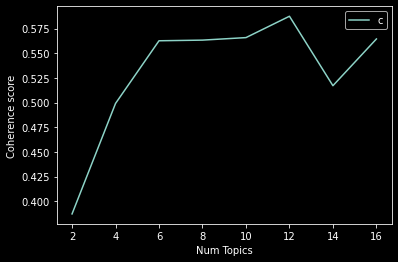

In [97]:
# show graph
limit=18; start=2; step=2
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [98]:
coherence_values

[0.38719850704275943,
 0.49909716780420227,
 0.5625934872590149,
 0.5632555377181476,
 0.5658046283016679,
 0.5874433479640047,
 0.5170930787311195,
 0.5644291727403208]

In [118]:
model_list

In [99]:
best_model = model_list[np.argmax(coherence_values)]
best_model.print_topics(num_words=15)

[(0,
  '0.141*"anak" + 0.035*"bayi" + 0.012*"asi" + 0.009*"susu" + 0.008*"vaksin" + 0.007*"berat_badan" + 0.006*"bb" + 0.006*"muntah" + 0.005*"demam" + 0.005*"kejang" + 0.005*"anak_demam" + 0.005*"turun" + 0.004*"badan" + 0.004*"panas" + 0.004*"susah"'),
 (1,
  '0.041*"batuk" + 0.017*"obat" + 0.016*"tenggorokan" + 0.016*"sakit" + 0.016*"paru" + 0.012*"flu" + 0.010*"pilek" + 0.009*"sesak" + 0.009*"hidung" + 0.009*"sesak_nafas" + 0.008*"nafas" + 0.008*"demam" + 0.007*"dada" + 0.006*"tidur" + 0.006*"bersin"'),
 (2,
  '0.052*"gatal" + 0.023*"kulit" + 0.011*"wajah" + 0.011*"merah" + 0.010*"jerawat" + 0.010*"obat" + 0.009*"alergi" + 0.009*"kering" + 0.007*"tangan" + 0.007*"bintik" + 0.007*"luka" + 0.007*"kaki" + 0.007*"air" + 0.006*"perih" + 0.005*"bibir"'),
 (3,
  '0.026*"luka" + 0.011*"operasi" + 0.007*"jahitan" + 0.006*"kuku" + 0.006*"kering" + 0.005*"bekas" + 0.004*"cairan" + 0.004*"darah" + 0.004*"operasi_usus" + 0.003*"usg" + 0.003*"infeksi" + 0.003*"bekas_operasi" + 0.003*"obat_cacing

In [100]:
topic_prob = []

for d in corpora_input:
    topic_dist = best_model.get_document_topics(d, minimum_probability=0.0)
    topic_prob.append(topic_dist)

In [101]:
topic_prob

[[(0, 0.27802122),
  (1, 0.0074403784),
  (2, 0.17825976),
  (3, 0.0074403784),
  (4, 0.0074403784),
  (5, 0.0074403784),
  (6, 0.0074403784),
  (7, 0.47675562),
  (8, 0.0074403784),
  (9, 0.007440379),
  (10, 0.0074403784),
  (11, 0.0074403784)],
 [(0, 0.005415991),
  (1, 0.005415991),
  (2, 0.005415991),
  (3, 0.005415991),
  (4, 0.005415991),
  (5, 0.005415991),
  (6, 0.005415991),
  (7, 0.5073843),
  (8, 0.005415991),
  (9, 0.005415991),
  (10, 0.43845576),
  (11, 0.005415991)],
 [(0, 0.0034338413),
  (1, 0.0034338413),
  (2, 0.0034338413),
  (3, 0.0034338413),
  (4, 0.0034338413),
  (5, 0.0034338413),
  (6, 0.0034338413),
  (7, 0.0034338413),
  (8, 0.50119424),
  (9, 0.0034338413),
  (10, 0.0034338413),
  (11, 0.46446735)],
 [(0, 0.008944656),
  (1, 0.1959315),
  (2, 0.008944656),
  (3, 0.008944656),
  (4, 0.008944656),
  (5, 0.008944656),
  (6, 0.008944656),
  (7, 0.008944656),
  (8, 0.008944656),
  (9, 0.008944656),
  (10, 0.28264368),
  (11, 0.4409229)],
 [(0, 0.005932486),
  (

In [102]:
df_training['question'][0]

'Dok,anak saya sudah imunisasi DPT, terus bekas suntik nya jadi bengkak dan merah..ada yang menyarankan di kompres air hangat, tapi menurut say agak kurang efektif..lalu saya kasih trombop*p apa boleh dokter?dan efektifkah untuk bengkak nya?'

In [103]:
topic_percentage = []

for doc_topics in topic_prob:
    total_probability = sum(prob for _, prob in doc_topics)
    topic_percentages = [(topic, prob / total_probability * 100) for topic, prob in doc_topics]
    topic_percentage.append(topic_percentages)

In [104]:
topic_percentage

[[(0, 27.80212158746622),
  (1, 0.7440378409921418),
  (2, 17.8259759809338),
  (3, 0.7440378409921418),
  (4, 0.7440378409921418),
  (5, 0.7440378409921418),
  (6, 0.7440378409921418),
  (7, 47.675561816104576),
  (8, 0.7440378409921418),
  (9, 0.7440378875582705),
  (10, 0.7440378409921418),
  (11, 0.7440378409921418)],
 [(0, 0.5415991110086177),
  (1, 0.5415991110086177),
  (2, 0.5415991110086177),
  (3, 0.5415991110086177),
  (4, 0.5415991110086177),
  (5, 0.5415991110086177),
  (6, 0.5415991110086177),
  (7, 50.73843153531645),
  (8, 0.5415991110086177),
  (9, 0.5415991110086177),
  (10, 43.84557735459737),
  (11, 0.5415991110086177)],
 [(0, 0.3433841287035199),
  (1, 0.3433841287035199),
  (2, 0.3433841287035199),
  (3, 0.3433841287035199),
  (4, 0.3433841287035199),
  (5, 0.3433841287035199),
  (6, 0.3433841287035199),
  (7, 0.3433841287035199),
  (8, 50.11942395962667),
  (9, 0.3433841287035199),
  (10, 0.3433841287035199),
  (11, 46.44673475333813)],
 [(0, 0.8944656143439493),

In [106]:
vis = pyLDAvis.gensim_models.prepare(best_model, corpora_input, dictionary_input, sort_topics=False)
vis_html = pyLDAvis.prepared_data_to_html(vis)

# Save the modified visualization to an HTML file
# pyLDAvis.save_html(vis, 'C:/Users/WINDOWS 10/Documents/Skripsi/scrapingFIX/output_fix1f.html')
pyLDAvis.display(vis)

In [107]:
df_training = df_training [['title', 'question', 'date' ,'tahun', 'clean2']]

In [108]:
df_training_dup = df_training[['title', 'question','date','tahun','clean2']]

In [109]:
train_vec = []
#create dictionary for topic 1-12


for i in range(len(df_training['question'])):
    top_topics = best_model.get_document_topics(corpora_input[i], minimum_probability=0.0)
    highest_prob_topic = max(top_topics, key=lambda x: x[1])
    topic_vec = [highest_prob_topic[1] if i == highest_prob_topic[0] else 0 for i in range(best_model.num_topics)]
    topic_vec.append(len(df_training['question'].iloc[i]))
    topic_vec.append(highest_prob_topic[0] + 1)
    topic_vec = [value for value in topic_vec if value != 0]  # Remove all the zeros
    train_vec.append(topic_vec)

In [111]:
topic_map = {1 : 'Kesehatan Bayi Dan Anak', 2 : 'Masalah Pernafasan (ISPA)', 3 : 'Masalah Kulit', 4 : 'Perawatan Luka',
             5 : 'Masalah Jantung dan Diabetes', 6 : 'Masalah Kesehatan Gigi', 7 : 'Prosedur Dan Pasca Operasi',
             8 : 'Penggunaan Obat', 9 : 'Masalah Menstruasi Dan Kehamilan', 10 : 'Masalah Kesehatan Mata',
             11 : 'Kesehatan Mental', 12 : 'Masalah Kesehatan Umum'}

In [112]:
df_vec = pd.DataFrame(train_vec, columns=['Probability', 'Number of words', 'Topic'])
df_vec_copy = df_vec.copy()
df_vec['Topic'] = df_vec['Topic'].map(topic_map)
df_training_dup = df_training_dup.join(df_vec, how='left')

In [113]:
df_training_dup.head()

,title,question,date,tahun,clean2,Probability,Number of words,Topic
0,Bengkak dan merah pasca imunisasi DPT,"Dok,anak saya sudah imunisasi DPT, terus bekas...",14 Januari 2018,2018,"[anak, imunisasi, bekas, suntik, bengkak, mera...",0.476564,240,Penggunaan Obat
1,penyebab mendengar suara yang terdengar lebih ...,"Dok, suara yang saya dengar tiba"" menjadi sang...",16 Januari 2018,2018,"[suara, dengar, keras, suara, dengar, volume, ...",0.507385,285,Penggunaan Obat
2,Perbedaan gejala hamil dengan sakit maag,mlm donk saya rina udah menikah usia 24 tahun ...,16 Januari 2018,2018,"[rina, menikah, haid, keputihan, haid, lelah, ...",0.501192,636,Masalah Menstruasi Dan Kehamilan
3,Mengatasi kepala pusing dan susah tidur,Dok saya mau bertanya kenapa ya saya akhir2 in...,16 Januari 2018,2018,"[susah, tidur, insomnia, tidur, kepala, pusing...",0.441144,176,Masalah Kesehatan Umum
4,penggunaan biotin untuk menumbuhkan rambut,"selamat malam dokter, saya mau tau info dong, ...",16 Januari 2018,2018,"[biotin, mcg, menumbuhkan, rambut, kekurangen,...",0.817727,365,Masalah Kesehatan Mata


In [114]:
bulan_map = {'Januari': 1, 'Februari': 2, 'Maret': 3, 'April': 4, 'Mei': 5, 'Juni': 6, 'Juli': 7, 'Agustus': 8, 'September': 9, 'Oktober': 10, 'November': 11, 'Desember': 12}
order_month = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

df_duby = df_training_dup.copy()
df_duby['tanggal'] = df_duby['date'].str.split().str[0]
df_duby['bulan'] = df_duby['date'].str.split().str[1]
df_duby['bulan'] = df_duby['bulan'].map(bulan_map)
df_duby['bulan'] = pd.to_datetime(df_duby['bulan'], format='%m').dt.month_name().apply(lambda x: x.capitalize()).astype(pd.api.types.CategoricalDtype(categories=order_month))
df_duby['time'] = df_duby.apply(lambda row: f"{row['bulan']}-{row['tahun']}", axis=1).apply(lambda x: datetime.strptime(x, '%B-%Y'))

In [115]:
df_usage = df_duby[df_duby['tahun'] >= '2018']
df_usage

,title,question,date,tahun,clean2,Probability,Number of words,Topic,tanggal,bulan,time
0,Bengkak dan merah pasca imunisasi DPT,"Dok,anak saya sudah imunisasi DPT, terus bekas...",14 Januari 2018,2018,"[anak, imunisasi, bekas, suntik, bengkak, mera...",0.476564,240,Penggunaan Obat,14,January,2018-01-01
1,penyebab mendengar suara yang terdengar lebih ...,"Dok, suara yang saya dengar tiba"" menjadi sang...",16 Januari 2018,2018,"[suara, dengar, keras, suara, dengar, volume, ...",0.507385,285,Penggunaan Obat,16,January,2018-01-01
2,Perbedaan gejala hamil dengan sakit maag,mlm donk saya rina udah menikah usia 24 tahun ...,16 Januari 2018,2018,"[rina, menikah, haid, keputihan, haid, lelah, ...",0.501192,636,Masalah Menstruasi Dan Kehamilan,16,January,2018-01-01
3,Mengatasi kepala pusing dan susah tidur,Dok saya mau bertanya kenapa ya saya akhir2 in...,16 Januari 2018,2018,"[susah, tidur, insomnia, tidur, kepala, pusing...",0.441144,176,Masalah Kesehatan Umum,16,January,2018-01-01
4,penggunaan biotin untuk menumbuhkan rambut,"selamat malam dokter, saya mau tau info dong, ...",16 Januari 2018,2018,"[biotin, mcg, menumbuhkan, rambut, kekurangen,...",0.817727,365,Masalah Kesehatan Mata,16,January,2018-01-01
...,...,...,...,...,...,...,...,...,...,...,...
255269,Penyebab mood berubah ubah dan ingin mengurung...,"Hai dok, saya mahsiswa smt 8 sedang skripsi, s...",12 Mei 2019,2019,"[mahsiswa, smt, skripsi, seminar, proposal, me...",0.987025,1864,Kesehatan Mental,12,May,2019-05-01
255270,Kelemahan dalam kemampuan menghafal,"hallo dok, umur saya 21 tahun, saya salah satu...",13 Mei 2019,2019,"[mahasiswa, jurusan, bahasa, asing, keseharian...",0.964639,620,Masalah Jantung dan Diabetes,13,May,2019-05-01
255271,Demam pada anak usia 8 bulan disertai bengkak ...,"Mau tanya dok,Bayi saya umur 8bulan.Saat ini s...",13 Mei 2019,2019,"[bayi, suhu, demamnya, panas, telapak, kiri, m...",0.439255,237,Kesehatan Bayi Dan Anak,13,May,2019-05-01
255272,Sakit pinggang dan perut bagian bawah terutama...,"Selamat mlm dok, perkenalkan sya ivon. Umur sy...",12 Mei 2019,2019,"[ivon, sakit, pinggang, perut, sakit, melebihi...",0.735432,510,Masalah Menstruasi Dan Kehamilan,12,May,2019-05-01


In [116]:
#create px line total topic per month
total_topic = df_usage.groupby(['time'])['Topic'].value_counts().reset_index(name='count')
total_topic = total_topic.sort_values(by=['time', 'Topic'])


fig = px.line(total_topic, x='time', y=total_topic['count'], color='Topic', title=' ', 
              color_discrete_sequence=['blue', 'green', 'red', 'purple', 'orange', 'yellow', 'pink', 'teal', 'brown', 'cyan', 'magenta', 'lime'],height=500, width=1000, 
              category_orders={'Topic': [f'Topic {i}' for i in range(1, 14)]})
fig.update_layout(xaxis_title='tahun', yaxis_title='Jumlah Kemunculan Topic', plot_bgcolor="white",
                  yaxis=dict(range=[1, 2500]))
fig.show()

----

# New Phase

In [119]:
from gensim.models.ldamulticore import LdaMulticore

def model_LDA(dictionary, corpus, texts, limit, start, step):
    
    coherence_values = []
    model_list = []
     
    for num_topics in range(start, limit, step):
        model = LdaMulticore(corpus=corpus,
                        id2word=dictionary,
                        num_topics=num_topics,
                        random_state=42,
                        chunksize=1801,
                        alpha=0.095, #alpha value can be set 1/total number of topics, eg 1/18
                        eta=0.06, #eta value can be set to the lowest value, just be experimental about it
                        decay=0.5,
                        minimum_probability=0.03,
                        per_word_topics=True,
                        iterations=50,
                        passes=90,
                        workers=4)
 
        model_list.append(model) 

        coherencemodel = CoherenceModel(model=model, 
                                        texts=texts,
                                        dictionary=dictionary, 
                                        coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())


    return model_list, coherence_values



In [120]:
df_train['tahun'] = df_train['date'].str.split().str[-1]
df_train['bulan'] = df_train['date'].str.split().str[1]
df_training['bulan'] = df_train['bulan']

In [121]:
bulan_map = {'Januari': 1, 'Februari': 2, 'Maret': 3, 'April': 4, 'Mei': 5, 'Juni': 6, 'Juli': 7, 'Agustus': 8, 'September': 9, 'Oktober': 10, 'November': 11, 'Desember': 12}
df_training['bulan'] = df_training['bulan'].map(bulan_map)

#dt format
order_month = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
df_training['bulan'] = pd.to_datetime(df_training['bulan'], format='%m').dt.month_name().apply(lambda x: x.capitalize()).astype(pd.api.types.CategoricalDtype(categories=order_month))

In [122]:
df_trap = df_training[['title', 'question', 'tahun', 'bulan','clean2']]
df_trap

,title,question,tahun,bulan,clean2
0,Bengkak dan merah pasca imunisasi DPT,"Dok,anak saya sudah imunisasi DPT, terus bekas...",2018,January,"[anak, imunisasi, bekas, suntik, bengkak, mera..."
1,penyebab mendengar suara yang terdengar lebih ...,"Dok, suara yang saya dengar tiba"" menjadi sang...",2018,January,"[suara, dengar, keras, suara, dengar, volume, ..."
2,Perbedaan gejala hamil dengan sakit maag,mlm donk saya rina udah menikah usia 24 tahun ...,2018,January,"[rina, menikah, haid, keputihan, haid, lelah, ..."
3,Mengatasi kepala pusing dan susah tidur,Dok saya mau bertanya kenapa ya saya akhir2 in...,2018,January,"[susah, tidur, insomnia, tidur, kepala, pusing..."
4,penggunaan biotin untuk menumbuhkan rambut,"selamat malam dokter, saya mau tau info dong, ...",2018,January,"[biotin, mcg, menumbuhkan, rambut, kekurangen,..."
...,...,...,...,...,...
255269,Penyebab mood berubah ubah dan ingin mengurung...,"Hai dok, saya mahsiswa smt 8 sedang skripsi, s...",2019,May,"[mahsiswa, smt, skripsi, seminar, proposal, me..."
255270,Kelemahan dalam kemampuan menghafal,"hallo dok, umur saya 21 tahun, saya salah satu...",2019,May,"[mahasiswa, jurusan, bahasa, asing, keseharian..."
255271,Demam pada anak usia 8 bulan disertai bengkak ...,"Mau tanya dok,Bayi saya umur 8bulan.Saat ini s...",2019,May,"[bayi, suhu, demamnya, panas, telapak, kiri, m..."
255272,Sakit pinggang dan perut bagian bawah terutama...,"Selamat mlm dok, perkenalkan sya ivon. Umur sy...",2019,May,"[ivon, sakit, pinggang, perut, sakit, melebihi..."


In [161]:
df_2018 = df_trap[df_trap['tahun'] == '2018'].reset_index(drop=True)
df_2019 = df_trap[df_trap['tahun'] == '2019'].reset_index(drop=True)
df_2020 = df_trap[df_trap['tahun'] == '2020'].reset_index(drop=True)
df_2021 = df_trap[df_trap['tahun'] == '2021'].reset_index(drop=True)
df_2022 = df_trap[df_trap['tahun'] == '2022'].reset_index(drop=True)

In [124]:
start = 2
limit = 18
step = 2

-----

# 2020

In [125]:
df_2020

,title,question,tahun,bulan,clean2
0,"Benjolan dibawah telinga, rahang sebelah kanan","Selamat malam dok,,,,,,,,Sya ingin bertanya do...",2020,November,"[anak, benjolan, telinga, leher, kanan, demam,..."
1,Apa penyebab rasa sakit itu muncul.?,"Dok mau tanya, saya sudah 2 minggu pasca melah...",2020,November,"[pasca, melahirkan, perut, kanan, sakit, menus..."
2,Apakah handphone yang tidak pakai data seluler...,Dok saya mau bertanya apakah kalo kita punya h...,2020,December,"[handphone, kartu, data, seluler, permainan, s..."
3,Sakit kepala seperti berdenyut dan pusing sete...,"Selamat malam dok, sore tadi saya banyak mengo...",2020,December,"[mengobrol, jumpa, introvert, setelahnya, saki..."
4,Benjolan di tenggorokan dan di bawah telinga kiri,"Selamat malam dok saya mau tanya, sudah bebera...",2020,December,"[benjolan, tenggorokan, sakit, tenggorokan, te..."
...,...,...,...,...,...
46444,Sakit gigi hingga sakit kepala bagian kiri,"Dok saya menderita sakit gigi awalnya dok , ka...",2020,January,"[sakit, gigi, tahan, mengurut, kepala, kepala,..."
46445,Efek samping operasi malformasi arteri-vena,Dokter spesialis menganjurkan operasi untuk pe...,2020,January,"[menganjurkan, operasi, avm, opersi]"
46446,Bagaimana tanda dan gejala gangguan pada ginjal?,"Selamat malam dok, ibu saya sering mengalami k...",2020,January,"[kaki, bengkak, beraktivitas, biduran, wajahny..."
46447,Cara mengatasi gatal di seluruh tubuh,"Halo dok, dok saya mengalami gatal-gatal disel...",2020,January,"[gatal, gatal, diseluruh, tubuh, menimbulkan, ..."


In [126]:
#create necesary input 20
trigrams_20 = trigram_func(df_2020['clean2'])
ttr20 = remove_tokens(trigrams_20, token_toremove)
dict_20 = dict_function(ttr20)
filtered_token20 = [[token for token in doc if token not in token_toremove] for doc in ttr20]
corpora_20 = [dict_20.doc2bow(text) for text in filtered_token20]

In [127]:
topics_2020, coherence_2020 = model_LDA(dictionary=dict_20, corpus=corpora_20, texts=filtered_token20, start = 2, limit=18, step=2) 

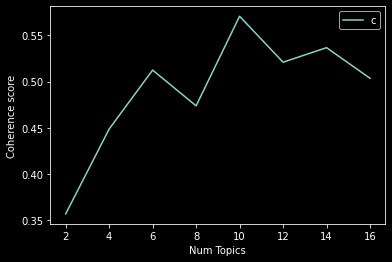

In [128]:
x_20 = range(start, limit, step)
plt.plot(x_20, coherence_2020)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [129]:
for i in topics_2020:
    topics = i.show_topics()
    for topic_id, topic_words in topics:
        print(f"Topic {topic_id}: {topic_words}")
    print("----------------------")

Topic 0: 0.042*"sakit" + 0.023*"obat" + 0.011*"gatal" + 0.011*"nyeri" + 0.009*"tidur" + 0.009*"batuk" + 0.007*"demam" + 0.006*"panas" + 0.005*"kaki" + 0.005*"pusing"
Topic 1: 0.030*"anak" + 0.015*"haid" + 0.014*"hamil" + 0.010*"obat" + 0.010*"darah" + 0.010*"sakit" + 0.009*"bayi" + 0.007*"mata" + 0.007*"perut" + 0.006*"takut"
----------------------
Topic 0: 0.041*"obat" + 0.032*"sakit" + 0.014*"gigi" + 0.013*"benjolan" + 0.012*"operasi" + 0.010*"nyeri" + 0.009*"bengkak" + 0.007*"telinga" + 0.007*"darah" + 0.006*"luka"
Topic 1: 0.047*"anak" + 0.026*"haid" + 0.023*"hamil" + 0.016*"darah" + 0.015*"bayi" + 0.013*"obat" + 0.010*"bab" + 0.009*"perut" + 0.009*"menstruasi" + 0.006*"kehamilan"
Topic 2: 0.062*"sakit" + 0.017*"batuk" + 0.016*"nyeri" + 0.016*"tidur" + 0.014*"demam" + 0.011*"pusing" + 0.011*"obat" + 0.009*"sakit_kepala" + 0.009*"panas" + 0.008*"kepala"
Topic 3: 0.030*"gatal" + 0.017*"anak" + 0.012*"kulit" + 0.009*"mata" + 0.009*"obat" + 0.008*"takut" + 0.008*"tidur" + 0.007*"merah"

In [130]:
topic20 = topics_2020[np.argmax(coherence_2020)]
vis_20 = pyLDAvis.gensim_models.prepare(topic20, corpora_20, dict_20, sort_topics=False)
#pyLDAvis.save_html(vis_20, 'C:/Users/WINDOWS 10/Documents/Skripsi/scrapingFIX/2020.html')
pyLDAvis.display(vis_20)

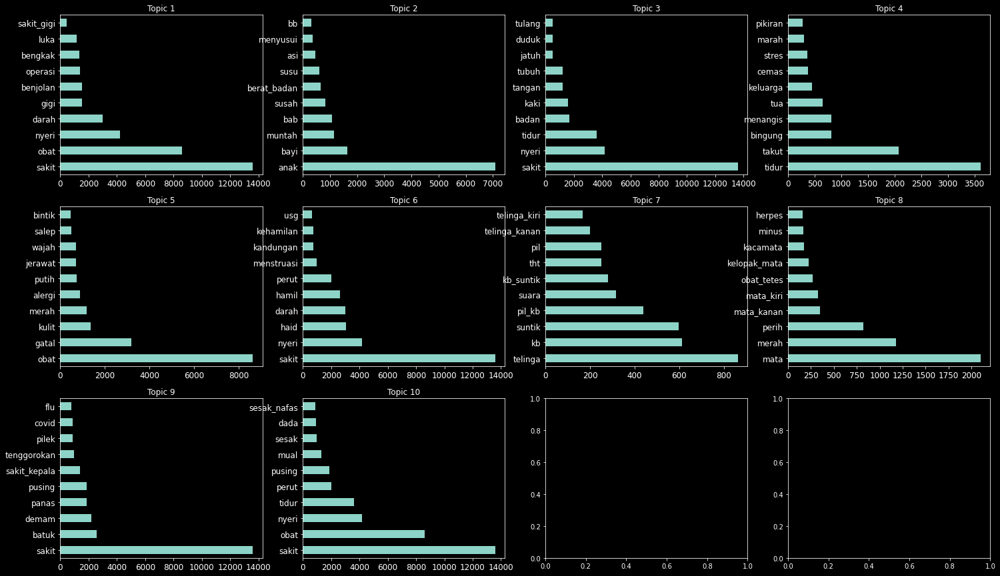

In [131]:
word_freq_20 = {}

# Iterate over the topics
for topic_id in range(topic20.num_topics):
    # Retrieve the words from the topic
    words = [word for word, _ in topic20.show_topic(topic_id)]

    topic_word_freq_20 = {}

    for doc in filtered_token20:
        # Count the occurrences of the words in each document
        for word in doc:
            if word in words:
                # Increment the word frequency for the topic
                topic_word_freq_20[word] = topic_word_freq_20.get(word, 0) + 1

    # Store the word frequencies for the topic if it is not empty
    if topic_word_freq_20:
        word_freq_20[f"Topic {topic_id + 1}"] = topic_word_freq_20

# Create DF from frequency word
df_word_freq_20 = pd.DataFrame(word_freq_20).fillna(0)

# Plot the Frequency

figeda,axes=plt.subplots(nrows = 3,ncols=4,figsize=(25,15))


for i, col in enumerate(df_word_freq_20.columns):
    
    df_word_freq_20[col].sort_values(ascending=False).head(10).plot(kind='barh',ax=axes[i//4,i%4],title=col,fontsize=12)

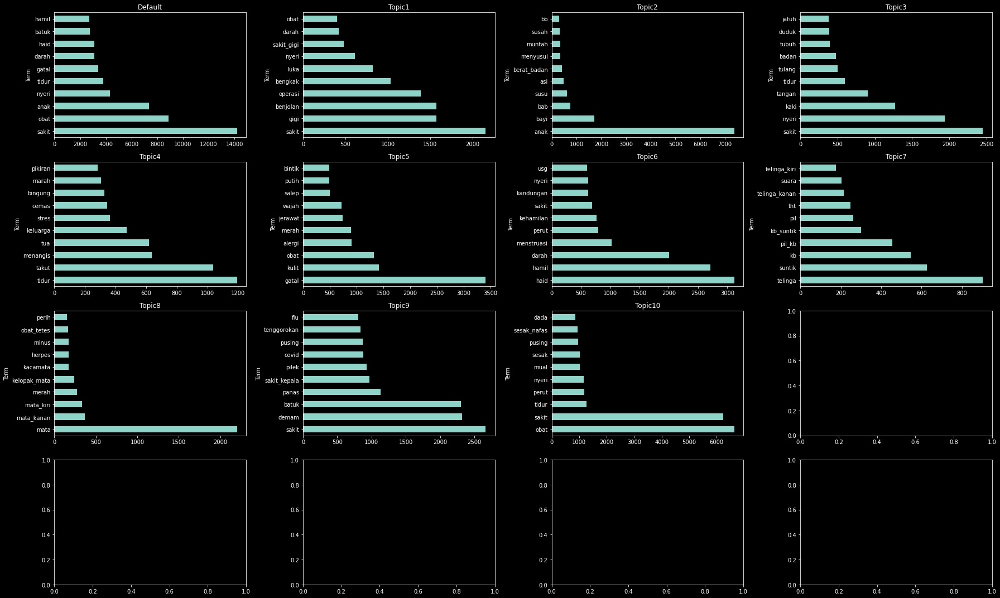

In [132]:
fq_20 = vis_20.topic_info
fq_20 = fq_20[['Category', 'Freq', 'Total', 'Term']]
fq_20 = fq_20.reset_index(drop=True)

fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(25, 15))

# Iterate over both index and value using enumerate
for i, col in enumerate(fq_20['Category'].unique()):
    ax = axes[i // 4, i % 4]
    ax.set_title(col)

    # Sort the data by frequency in descending order
    sorted_data = fq_20[fq_20['Category'] == col].sort_values('Freq', ascending=False)
    top_10_data = sorted_data.head(10)
    
    top_10_data.plot(kind='barh', x='Term', y='Freq', ax=ax, legend=False)

plt.tight_layout()
plt.show()


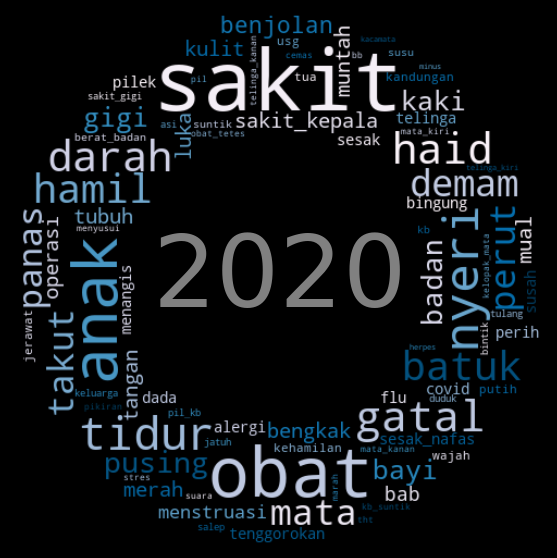

In [133]:
word_freq_text_20 = {}

for i in word_freq_20.values():
    word_freq_text_20.update(i)

# word_freq_text_20 = ' '.join(df_word_freq_20.index.tolist())

x, y = np.ogrid[:500, :500]
mask_outer = (x - 250) ** 2 + (y - 250) ** 2 > 250 ** 2
mask_inner = (x - 250) ** 2 + (y - 250) ** 2 < 130 ** 2
mask = np.logical_or(mask_outer, mask_inner)
mask = 255 * mask.astype(int)

wordcloud = WordCloud(width=1000, height=800, background_color='black', mask=mask, colormap='PuBu').generate_from_frequencies(word_freq_text_20)

plt.figure(figsize=(12, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.text(250, 250, "2020", fontsize=100, color='grey', ha='center', va='center')

plt.show()


In [134]:
word_freq_text_20

{'nyeri': 4202,
 'sakit': 13606,
 'benjolan': 1525,
 'obat': 8616,
 'darah': 3020,
 'operasi': 1377,
 'gigi': 1533,
 'bengkak': 1336,
 'luka': 1155,
 'sakit_gigi': 457,
 'anak': 7094,
 'bayi': 1645,
 'bab': 1064,
 'berat_badan': 646,
 'menyusui': 352,
 'muntah': 1141,
 'susah': 827,
 'bb': 310,
 'asi': 463,
 'susu': 596,
 'tidur': 3617,
 'tubuh': 1219,
 'duduk': 497,
 'tangan': 1241,
 'badan': 1712,
 'kaki': 1593,
 'tulang': 488,
 'jatuh': 506,
 'bingung': 819,
 'tua': 648,
 'takut': 2080,
 'keluarga': 453,
 'cemas': 375,
 'stres': 359,
 'pikiran': 270,
 'menangis': 811,
 'marah': 294,
 'gatal': 3189,
 'kulit': 1367,
 'merah': 1175,
 'jerawat': 712,
 'alergi': 873,
 'putih': 737,
 'salep': 492,
 'wajah': 708,
 'bintik': 477,
 'haid': 3055,
 'hamil': 2645,
 'usg': 658,
 'kandungan': 757,
 'perut': 2029,
 'menstruasi': 994,
 'kehamilan': 754,
 'telinga_kanan': 201,
 'kb': 612,
 'telinga': 864,
 'pil': 251,
 'suntik': 598,
 'pil_kb': 438,
 'tht': 252,
 'suara': 318,
 'telinga_kiri': 167,


In [143]:
train_vecs_20 = []

for i in range(len(df_2020['question'])):
    top_topics = topic20.get_document_topics(corpora_20[i], minimum_probability=0.0)
    highest_prob_topic = max(top_topics, key=lambda x: x[1])
    topic_vec = [highest_prob_topic[1] if i == highest_prob_topic[0] else 0 for i in range(topic20.num_topics)]
    topic_vec.append(len(df_2020['question'].iloc[i]))
    topic_vec.append(highest_prob_topic[0] + 1)
    topic_vec = [value for value in topic_vec if value != 0]  # Remove all the zeros
    train_vecs_20.append(topic_vec)

In [144]:
topic20.print_topics(num_words=15)

[(0,
  '0.038*"sakit" + 0.028*"gigi" + 0.028*"benjolan" + 0.025*"operasi" + 0.018*"bengkak" + 0.015*"luka" + 0.011*"nyeri" + 0.009*"sakit_gigi" + 0.008*"darah" + 0.007*"obat" + 0.006*"gusi" + 0.005*"berdarah" + 0.005*"takut" + 0.005*"nanah" + 0.004*"pecah"'),
 (1,
  '0.142*"anak" + 0.033*"bayi" + 0.015*"bab" + 0.012*"susu" + 0.009*"asi" + 0.008*"berat_badan" + 0.007*"menyusui" + 0.007*"muntah" + 0.006*"susah" + 0.006*"bb" + 0.005*"lahir" + 0.005*"tidur" + 0.004*"turun" + 0.004*"imunisasi" + 0.004*"menangis"'),
 (2,
  '0.044*"sakit" + 0.035*"nyeri" + 0.023*"kaki" + 0.016*"tangan" + 0.011*"tidur" + 0.009*"tulang" + 0.009*"badan" + 0.007*"tubuh" + 0.007*"duduk" + 0.007*"jatuh" + 0.007*"pegal" + 0.006*"kepala" + 0.006*"telapak_kaki" + 0.005*"berdiri" + 0.005*"olahraga"'),
 (3,
  '0.021*"tidur" + 0.019*"takut" + 0.011*"menangis" + 0.011*"tua" + 0.009*"keluarga" + 0.006*"stres" + 0.006*"cemas" + 0.006*"bingung" + 0.005*"marah" + 0.005*"pikiran" + 0.005*"depresi" + 0.005*"hidup" + 0.005*"sedi

In [145]:
topic_map20 = { 
    1 : 'Masalah Kesehatan Gigi', 
    2 : 'Kesehatan Bayi Dan Anak', 
    3 : 'Masalah Sakit Nyeri Tubuh', 
    4 : 'Kesehatan Mental',   
    5 : 'Masalah Kulit', 
    6 : 'Masalah Menstruasi Dan Kehamilan', 
    7 : 'Masalah Telinga dan Program KB',    
    8 : 'Masalah Kesehatan Mata', 
    9 : 'Masalah Pernafasan (ISPA)', 
    10 : 'Masalah Kesehatan Umum'}

df_vec_20 = pd.DataFrame(train_vecs_20, columns=['Probability', 'Number of words', 'Topic'])
df_vec_20['Topic'] = df_vec_20['Topic'].map(topic_map20)
df_2020 = df_2020.join(df_vec_20, how='left')

In [154]:
#create px line total topic per month
total_topic20 = df_2020.groupby(['bulan'])['Topic'].value_counts().reset_index(name='count')
total_topic20 = total_topic20.sort_values(by=['bulan', 'Topic'])


fig = px.line(total_topic20, x='bulan', y=total_topic20['count'], color='Topic', 
              color_discrete_sequence=['blue', 'green', 'red', 'purple', 'orange', 'yellow', 'pink', 'teal', 'brown', 'cyan', 'magenta', 'lime'],height=500, width=900, 
              category_orders={'Topic': [f'Topic {i}' for i in range(1, 14)]})
fig.update_layout(xaxis_title='Bulan', plot_bgcolor="white",
                  yaxis=dict(range=[1, 1500]))
fig.show()

In [ ]:
t20 = df_2020.groupby(['Topic'])['bulan'].count().reset_index(name='Total').sort_values(by='Topic', ascending=False)
t20 = t20.sort_values(by='Topic', ascending=False)
t20['Topic'] = t20['Topic'].astype(str)  # Convert 'Topic' to string type

fig = px.bar(t20, y='Topic', x='Total', text='Total', orientation='h', title='Total Kemunculan Topic pada 2020',
             color='Topic', color_discrete_sequence=px.colors.qualitative.Dark24,height=500,width=800,
             category_orders={'Topic': [f'Topic {i}' for i in range(1, 14)]})

fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide', xaxis_title='Jumlah Kemunculan Topic', yaxis_title='Topic',
                  plot_bgcolor="white", showlegend=False, coloraxis_colorbar_title='Topic')
fig.update_layout(yaxis_title_standoff=1, xaxis_title_standoff=10)
fig.show()

In [ ]:
topic20.print_topics(num_words=15)

----

----

# 2021

In [135]:
df_2021

,title,question,tahun,bulan,clean2
0,Flek berwarna coklat tua dengan durasi singkat,"Mlm dok, sya mau bertanya dok, sya kan udh 2X ...",2021,December,"[suntik, kb, haid, coklat, pertanda, hamil]"
1,"Demam tinggi, pucat dan keluar keringat dingin","Malam dok,,,anak saya umur 4 thn habis demam t...",2021,December,"[anak, demam, suhu, badan, turun, suhunya, tur..."
2,Penggunaan asam mefenamat untuk mengatasi nyeri,"Halo dok, sya ibu menyusui sedang ada masalah ...",2021,December,"[menyusui, bengkak, telinga, nyeri, diresepkan..."
3,Pengobatan saat mengalami cacar air,"Dok, sya udh 3 hr kena cacar air kok msh gatal...",2021,December,"[cacar, air, gatal, cekit, mnum, obt, valacicl..."
4,Penyebab sakit kepala sebelah,"Halo dok, saya mau tanya, jadi saya sering men...",2021,December,"[sakit, kepala, sakit, samar, samar, air, seir..."
...,...,...,...,...,...
34389,Nyeri disekitar anus saat mengejan,"Hallo sok , mohon di berikan penjelasan nya ya...",2021,January,"[rektum, sakit, aga, mengejan, ngeden, berhub,..."
34390,Bayi usia 5 bulan diare disertai feses berwarn...,"Selamat pagi dok, anak saya umur 5 bulan pas, ...",2021,January,"[anak, perjalanan, lumayan, anak, bab, feses, ..."
34391,Hasil pemeriksaan swab PCR positif,Hi dokMau tanya hasil swab saya presumtif posi...,2021,January,"[dokmau, swab, presumtif, positifgen, e, dokda..."
34392,Apakah berbagi sabun mandi yang sama dapat men...,"Dok, mau nanya apa betul berbagi sabun mandi y...",2021,January,"[berbagi, sabun, timbul, kulit, menular, kesal..."


In [136]:
#create necesary input 21
trigrams_21 = trigram_func(df_2021['clean2'])
ttr21 = remove_tokens(trigrams_21, token_toremove)
dict_21 = dict_function(ttr21)
filtered_token21 = [[token for token in doc if token not in token_toremove] for doc in ttr21]
corpora_21 = [dict_21.doc2bow(text) for text in filtered_token21]

In [137]:
topics_2021, coherence_2021 = model_LDA(dictionary=dict_21, corpus=corpora_21, texts=filtered_token21, start = 2, limit=18, step=2) 

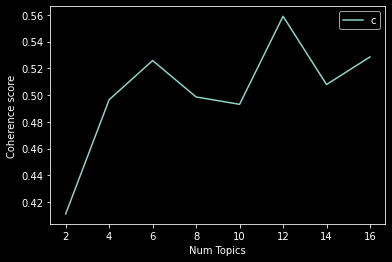

In [138]:
x_21 = range(start, limit, step)
plt.plot(x_21, coherence_2021)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [139]:
topic21 = topics_2021[np.argmax(coherence_2021)]
vis_21 = pyLDAvis.gensim_models.prepare(topic21, corpora_21, dict_21, sort_topics=False)
#pyLDAvis.save_html(vis_21, 'C:/Users/WINDOWS 10/Documents/Skripsi/scrapingFIX/2021.html')
pyLDAvis.display(vis_21)

In pyLDAvis, the left slider controls the total frequency of a term across all topics, while the right slider controls the relevance of the term within a specific topic


Here is a breakdown of the differences between the two sliders:
The left slider controls the total frequency of a term across all topics. When the slider is moved to the left, the terms with the highest total frequency are displayed at the top of the list, and when the slider is moved to the right, the terms with the lowest total frequency are displayed at the top of the list


The right slider controls the relevance of the term within a specific topic. When the slider is moved to the left, the most relevant terms for the selected topic are displayed at the top of the list, and when the slider is moved to the right, the least relevant terms for the selected topic are displayed at the top of the list


The left slider is used to filter out terms that are too common or too rare across all topics, while the right slider is used to identify the most relevant terms for a specific topic



The left slider is useful for identifying stop words or terms that are not informative, while the right slider is useful for identifying the most important terms for a specific topic


The left slider is used to filter out terms that are too common or too rare across all topics, while the right slider is used to identify the most relevant terms for a specific topic


In summary, the left slider in pyLDAvis controls the total frequency of a term across all topics, while the right slider controls the relevance of the term within a specific topic. The left slider is used to filter out terms that are too common or too rare across all topics, while the right slider is used to identify the most important terms for a specific topic.

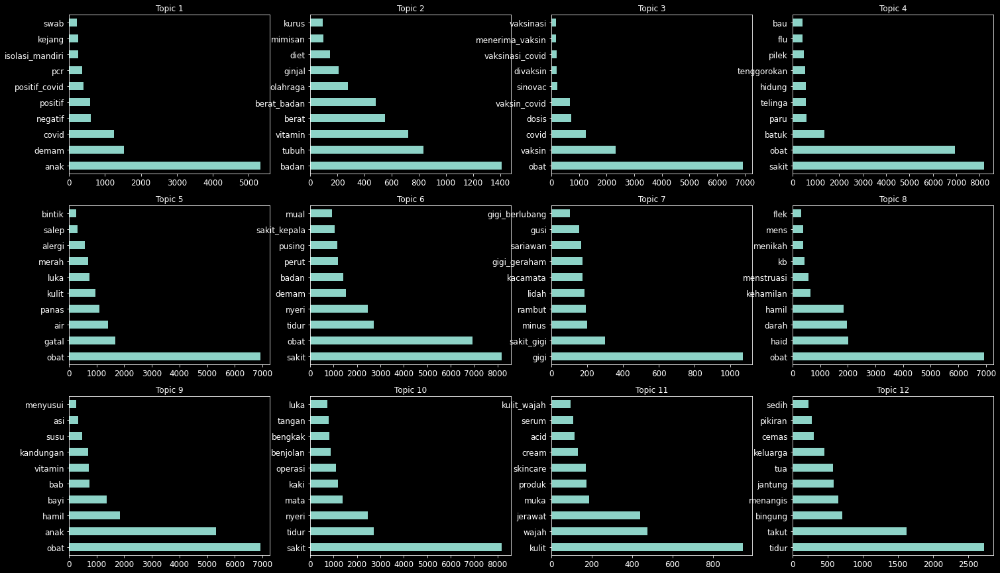

In [140]:
word_freq_21 = {}

# Iterate over the topics
for topic_id in range(topic21.num_topics):
    # Retrieve the words from the topic
    words = [word for word, _ in topic21.show_topic(topic_id)]

    topic_word_freq_21 = {}

    for doc in filtered_token21:
        # Count the occurrences of the words in each document
        for word in doc:
            if word in words:
                # Increment the word frequency for the topic
                topic_word_freq_21[word] = topic_word_freq_21.get(word, 0) + 1

    # Store the word frequencies for the topic if it is not empty
    if topic_word_freq_21:
        word_freq_21[f"Topic {topic_id + 1}"] = topic_word_freq_21

# Create DF from frequency word
df_word_freq_21 = pd.DataFrame(word_freq_21).fillna(0)

# Plot the Frequency

figeda,axes=plt.subplots(nrows = 3,ncols=4,figsize=(25,15))


for i, col in enumerate(df_word_freq_21.columns):
    
    df_word_freq_21[col].sort_values(ascending=False).head(10).plot(kind='barh',ax=axes[i//4,i%4],title=col,fontsize=12)

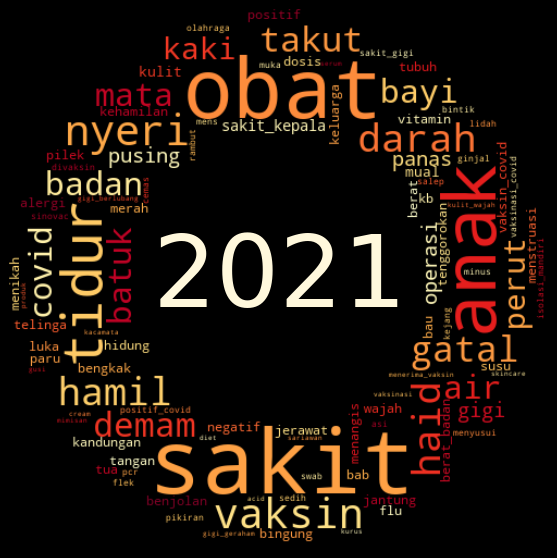

In [141]:
word_freq_text_21 = {}

for i in word_freq_21.values():
    word_freq_text_21.update(i)

# word_freq_text_21 = ' '.join(df_word_freq_21.index.tolist())

x, y = np.ogrid[:500, :500]
mask_outer = (x - 250) ** 2 + (y - 250) ** 2 > 250 ** 2
mask_inner = (x - 250) ** 2 + (y - 250) ** 2 < 130 ** 2
mask = np.logical_or(mask_outer, mask_inner)
mask = 255 * mask.astype(int)

wordcloud = WordCloud(width=1000, height=800, background_color='black', mask=mask, colormap='YlOrRd').generate_from_frequencies(word_freq_text_21)

plt.figure(figsize=(12, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.text(250, 250, "2021", fontsize=100, color='cornsilk', ha='center', va='center')

plt.show()


In [159]:
train_vecs_21 = []

for i in range(len(df_2021['question'])):
    top_topics = topic21.get_document_topics(corpora_21[i], minimum_probability=0.0)
    highest_prob_topic = max(top_topics, key=lambda x: x[1])
    topic_vec = [highest_prob_topic[1] if i == highest_prob_topic[0] else 0 for i in range(topic21.num_topics)]
    topic_vec.append(len(df_2021['question'].iloc[i]))
    topic_vec.append(highest_prob_topic[0] + 1)
    topic_vec = [value for value in topic_vec if value != 0]  # Remove all the zeros
    train_vecs_21.append(topic_vec)

In [162]:
topic_map21 = { 
    1 : 'Masalah COVID pada Anak', 
    2 : 'Pengelolaan Masalah Berat Badan', 
    3 : 'Masalah Vaksin COVID 19', 
    4 : 'Masalah Pernafasan (ISPA)',   
    5 : 'Masalah Kulit & Alergi', 
    6 : 'Masalah Kesehatan Umum', 
    7 : 'Masalah Kesehatan Gigi',    
    8 : 'Masalah Menstruasi Dan Kehamilan', 
    9 : 'Kesehatan Bayi Dan Anak', 
    10 : 'Masalah Sakit Nyeri Tubuh',
    11 : 'Masalah Perawatan Wajah',
    12 : 'Kesehatan Mental'}

df_vec_21 = pd.DataFrame(train_vecs_21, columns=['Probability', 'Number of words', 'Topic'])
df_vec_21['Topic'] = df_vec_21['Topic'].map(topic_map21)
df_2021 = df_2021.join(df_vec_21, how='left')

In [166]:
#create px line total topic per month
total_topic21 = df_2021.groupby(['bulan'])['Topic'].value_counts().reset_index(name='count')
total_topic21 = total_topic21.sort_values(by=['bulan', 'Topic'])


fig = px.line(total_topic21, x='bulan', y=total_topic21['count'], color='Topic', 
              color_discrete_sequence=['blue', 'green', 'red', 'purple', 'orange', 'yellow', 'pink', 'teal', 'brown', 'cyan', 'magenta', 'lime'],height=600, width=1000, 
              category_orders={'Topic': [f'Topic {i}' for i in range(1, 14)]})
fig.update_layout(xaxis_title='Bulan', plot_bgcolor="white",
                  yaxis=dict(range=[1, 1000]))
fig.show()

In [ ]:
t21 = df_2021.groupby(['Topic'])['bulan'].count().reset_index(name='Total').sort_values(by='Topic', ascending=False)
t21 = t21.sort_values(by='Topic', ascending=False)
t21['Topic'] = t21['Topic'].astype(str)  # Convert 'Topic' to string type

fig = px.bar(t21, y='Topic', x='Total', text='Total', orientation='h', title='Total Kemunculan Topic pada 2021',
             color='Topic', color_discrete_sequence=px.colors.qualitative.Dark24,height=500,width=800,
             category_orders={'Topic': [f'Topic {i}' for i in range(1, 14)]})

fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide', xaxis_title='Jumlah Kemunculan Topic', yaxis_title='Topic',
                  plot_bgcolor="white", showlegend=False, coloraxis_colorbar_title='Topic')
fig.update_layout(yaxis_title_standoff=1, xaxis_title_standoff=10)
fig.show()

In [155]:
topic21.print_topics(num_words=15)

[(0,
  '0.104*"anak" + 0.022*"covid" + 0.016*"demam" + 0.013*"positif" + 0.012*"negatif" + 0.011*"positif_covid" + 0.010*"pcr" + 0.007*"isolasi_mandiri" + 0.006*"swab" + 0.006*"kejang" + 0.006*"isoman" + 0.006*"swab_antigen" + 0.005*"anak_demam" + 0.005*"turun" + 0.005*"batuk_pilek"'),
 (1,
  '0.015*"berat_badan" + 0.013*"olahraga" + 0.009*"badan" + 0.008*"ginjal" + 0.007*"tubuh" + 0.006*"diet" + 0.005*"berat" + 0.004*"mimisan" + 0.004*"kurus" + 0.004*"vitamin" + 0.003*"tiroid" + 0.003*"usg" + 0.003*"vitamin_b" + 0.003*"operasi" + 0.003*"onani"'),
 (2,
  '0.078*"vaksin" + 0.025*"dosis" + 0.024*"vaksin_covid" + 0.014*"obat" + 0.007*"sinovac" + 0.007*"divaksin" + 0.007*"covid" + 0.007*"vaksinasi_covid" + 0.006*"menerima_vaksin" + 0.006*"vaksinasi" + 0.004*"bisul" + 0.003*"jadwal_vaksin" + 0.003*"divaksin_covid" + 0.003*"dosis_vaksin" + 0.003*"suntik"'),
 (3,
  '0.038*"batuk" + 0.030*"obat" + 0.018*"paru" + 0.018*"hidung" + 0.015*"telinga" + 0.013*"bau" + 0.012*"sakit" + 0.012*"tenggoroka

----